# Advanced GAN
## Mateusz Cedro

Building advanced Generative Adversarial Network with some performance tracking tools.

## 0. Import libraries

In [1]:
import torch, torchvision, os, PIL, pdb
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid

import numpy as np
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

### 0.1 WandB configuration

In [3]:
!pip install wandb -qqq
import wandb
wandb.login(key='eeb9b427446aaf531adbe8c448f7699b77e7a31c')

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [4]:
%%capture
experiment_name = wandb.util.generate_id()

myrun = wandb.init(
    project="GAN v1",
    group=experiment_name,
    config={
        'optimizer': 'adam',
        'model': 'wGAN',
        'epoch': '100',
        'batch_size': 128
    }
)

config = wandb.config

In [5]:
print(experiment_name)

hk0svmml


In [6]:
# Show function with access to the WandB performance tracking system
def show(tensor, num=25, wandbactive=0, name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num], nrow=5).permute(1,2,0)

  if wandbactive == 1:
    wandb.log({name:wandb.Image(grid.numpy().clip(0,1))})

  plt.imshow(grid.clip(0,1))
  plt.show()

# Hyperparameters and general parameters
n_epochs = 100
batch_size = 128
lr = 1e-4
z_dim = 200 # dimensionality of the latent space

curr_step = 0 # current step
critic_cycles = 5 # critic number of cycles - firstely five cyles of training of the critis, then one cycle of training the generator

gen_losses = []
critic_losses = []
show_step = 750
save_step = 750

wandbactive = 1 # want to track stats through weights and biases


## 1. Building Models

### 1.1 Generator Model

In [7]:
# Generator model

class Generator(nn.Module):
  def __init__(self, z_dim=64, d_dim=16):
    super().__init__()
    self.z_dim = z_dim

    self.gen = nn.Sequential(
        # Calculating new width and height in ConvTranspose2d: (n-1)*stride - 2*padding + kernel_size

        nn.ConvTranspose2d(in_channels=z_dim, # Start with a 1x1 image with z_dim number of channels
                           out_channels=d_dim*32,
                           kernel_size=4,
                           stride=1,
                           padding=0), # Output: 4x4 (ch: 200, 512)
        nn.BatchNorm2d(d_dim*32),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(in_channels=d_dim*32,
                           out_channels=d_dim*16,
                           kernel_size=4,
                           stride=2,
                           padding=1), # Output: 8x8 (ch: 512, 256)
        nn.BatchNorm2d(d_dim*16),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(in_channels=d_dim*16,
                           out_channels=d_dim*8,
                           kernel_size=4,
                           stride=2,
                           padding=1), # Output: 16x16 (ch: 256, 128)
        nn.BatchNorm2d(d_dim*8),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(in_channels=d_dim*8,
                           out_channels=d_dim*4,
                           kernel_size=4,
                           stride=2,
                           padding=1), # Output: 32x32 (ch: 128, 64)
        nn.BatchNorm2d(d_dim*4),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(in_channels=d_dim*4,
                           out_channels=d_dim*2,
                           kernel_size=4,
                           stride=2,
                           padding=1), # Output: 64x64 (ch: 64, 32)
        nn.BatchNorm2d(d_dim*2),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(in_channels=d_dim*2,
                           out_channels=3, # Desired number of output channels
                           kernel_size=4,
                           stride=2,
                           padding=1), # Output: 128x128 (ch: 32, 3)
        nn.Tanh() # Produces results in the range [-1, 1]
    )

  def forward(self, noise):
    x = noise.view(len(noise), self.z_dim, 1, 1) # 128 x 200 x 1 x 1 - (batch_size, num_channels, H, W)
    return self.gen(x)


def gen_noise(num, z_dim, device='cuda'):
  return torch.randn(num, z_dim, device=device)

### 1.2 Critic Model

In [8]:
# Critic Model

class Critic(nn.Module):
  def __init__(self, d_dim=16):
    super().__init__()
    self.critic = nn.Sequential(
        # Calculating new width and height in Conv2d: (n + 2*padding - kernel_size)//stride + 1

        nn.Conv2d(in_channels=3,
                  out_channels=d_dim,
                  kernel_size=4,
                  stride=2,
                  padding=1), # Output: 64x64 (ch: 3, 16)
        nn.InstanceNorm2d(d_dim),
        nn.LeakyReLU(0.2),

        nn.Conv2d(in_channels=d_dim,
                  out_channels=d_dim*2,
                  kernel_size=4,
                  stride=2,
                  padding=1), # Output: 32x32 (ch: 16, 32)
        nn.InstanceNorm2d(d_dim*2),
        nn.LeakyReLU(0.2),

        nn.Conv2d(in_channels=d_dim*2,
                  out_channels=d_dim*4,
                  kernel_size=4,
                  stride=2,
                  padding=1), # Output: 16x16 (ch: 32, 64)
        nn.InstanceNorm2d(d_dim*4),
        nn.LeakyReLU(0.2),

        nn.Conv2d(in_channels=d_dim*4,
                  out_channels=d_dim*8,
                  kernel_size=4,
                  stride=2,
                  padding=1), # Output: 8x8 (ch: 64, 128)
        nn.InstanceNorm2d(d_dim*8),
        nn.LeakyReLU(0.2),

        nn.Conv2d(in_channels=d_dim*8,
                  out_channels=d_dim*16,
                  kernel_size=4,
                  stride=2,
                  padding=1), # Output: 4x4 (ch: 128, 256)
        nn.InstanceNorm2d(d_dim*16),
        nn.LeakyReLU(0.2),

        nn.Conv2d(in_channels=d_dim*16,
                  out_channels=1,
                  kernel_size=4,
                  stride=1,
                  padding=0), # Output: 1x1 (ch: 256, 1)
    )

  def forward(self, image):
    # image: 128 x 3 x 128 x 128
    critic_pred = self.critic(image) # 128 x 1 x 1 x 1
    return critic_pred.view(len(critic_pred), -1) # 128 x 1

## 2. Data
CelebA dataset

### 2.1 Downloading the data

In [9]:
import gdown, zipfile

url='https://dl.dropboxusercontent.com/scl/fi/vltmt8hlgdf9mv9kn7d0b/img_align_celeba.zip?rlkey=tacwpkr8d9bjpctdftjg3b00a'
path='data/celeba'
download_path=f'{path}/img_align_celeba.zip'

gdown.download(url, download_path, quiet=False)

with zipfile.ZipFile(download_path, 'r') as ziphandler:
  ziphandler.extractall(path)

Downloading...
From: https://dl.dropboxusercontent.com/scl/fi/vltmt8hlgdf9mv9kn7d0b/img_align_celeba.zip?rlkey=tacwpkr8d9bjpctdftjg3b00a
To: /content/data/celeba/img_align_celeba.zip
100%|██████████| 1.44G/1.44G [01:31<00:00, 15.9MB/s]


### 2.2 Dataset, DataLoader, declare Gen and Critic and Gradient Penalty

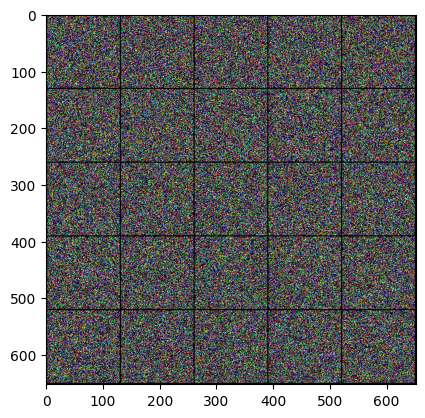

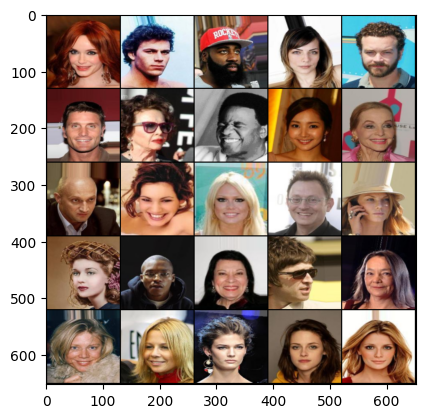

In [10]:
class Dataset(Dataset):
  def __init__(self, path, size=128, lim=10000):
    self.sizes = [size, size]
    items, labels = [], []

    for data in os.listdir(path)[:lim]:
      item = os.path.join(path, data)
      items.append(item)
      labels.append(data)

    self.items = items
    self.labels = labels


  def __len__(self):
    return len(self.items)

  def __getitem__(self, index):
    data = PIL.Image.open(self.items[index]).convert('RGB')
    data = np.asarray(transforms.Resize(self.sizes)(data))
    data = np.transpose(data, (2, 0, 1)).astype(np.float32, copy=False)
    data = torch.from_numpy(data).div(255)
    return data, self.labels[index]

# Dataset
data_path = './data/celeba/img_align_celeba'
ds = Dataset(data_path, size=128, lim=10000)

# DataLoader
dataloader = DataLoader(ds, batch_size=batch_size, shuffle=True)

# Models
gen = Generator(z_dim).to(device)
critic = Critic().to(device)

# Optimizers
gen_optim = torch.optim.Adam(gen.parameters(),
                             lr=lr,
                             betas=(0.5, 0.9))

critic_optim = torch.optim.Adam(critic.parameters(),
                             lr=lr,
                             betas=(0.5, 0.9))

# WandB
if wandbactive == 1:
  wandb.watch(gen, log_freq=100)
  wandb.watch(critic, log_freq=100)

x, y = next(iter(dataloader))
show(tensor=torch.randn([25, 3, 128, 128]), num=25)
show(x)

In [11]:
# Gradient penalty calculation

def get_gp(real, fake, critic, alpha, gamma=10):
  mix_images = real*alpha + fake*(1-alpha) # 128 x 3 x 128 x 128, linear interpolation
  mix_scores = critic(mix_images) # 128 x 1

  # Calculating gradients -> penalize them if too large
  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs=torch.ones_like(mix_scores),
      retain_graph=True,
      create_graph=True,
  )[0] # 128 x 3 x 128 x 128

  gradient = gradient.view(len(gradient), -1) # 128 x 49152
  gradient_norm =gradient.norm(2, dim=1) #L2 norm
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp


### 2.3 Save and load checkpoints

In [12]:
# Save and load checkpoints

root_path = './data/'

def save_checkpoint(name):
  torch.save({
      'epoch': epoch,
      'model_state_dict': gen.state_dict(),
      'optimizer_state_dict': gen_optim.state_dict(),
  }, f"{root_path}G-{name}.pkl")

  torch.save({
      'epoch': epoch,
      'model_state_dict': critic.state_dict(),
      'optimizer_state_dict': critic_optim.state_dict(),
  }, f"{root_path}C-{name}.pkl")

  print("Saved checkpoint")


def load_checkpoint(name):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint['model_state_dict'])
  gen_optim.load_state_dict(checkpoint['optimizer_state_dict'])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  critic.load_state_dict(checkpoint['model_state_dict'])
  critic_optim.load_state_dict(checkpoint['optimizer_state_dict'])

  print("loaded checkpoint")

## 3. Training

### 3.1 Training Loop

  0%|          | 0/79 [00:00<?, ?it/s]

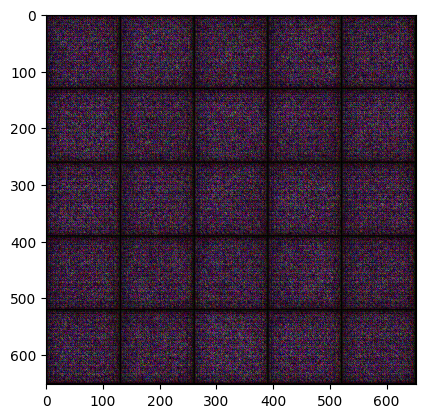

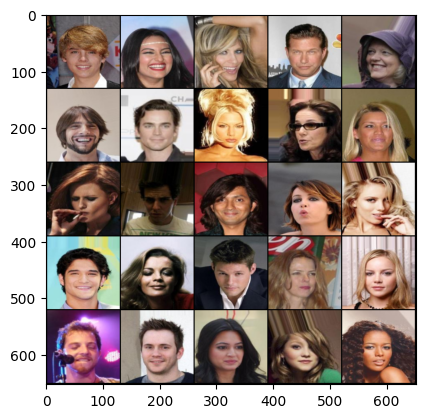

Epoch: 0, Step: 0, Generator loss: -0.0002556973695755005, Critic loss: 0.09125894165039063


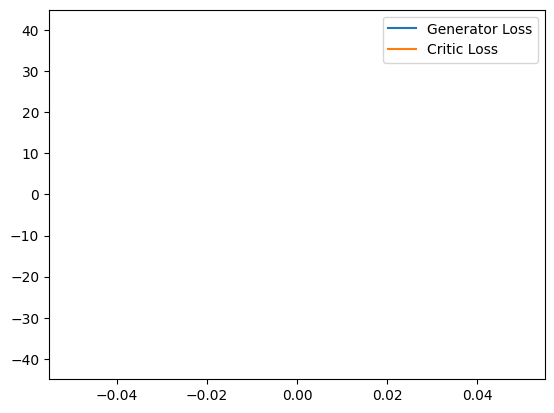

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  750
Saved checkpoint


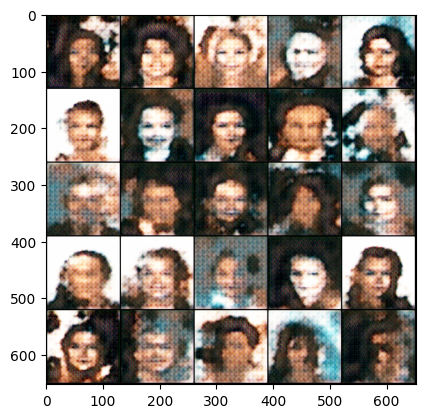

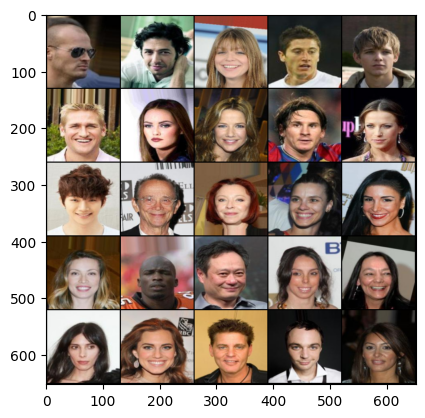

Epoch: 9, Step: 750, Generator loss: 25.741773745338122, Critic loss: -14.271584859450643


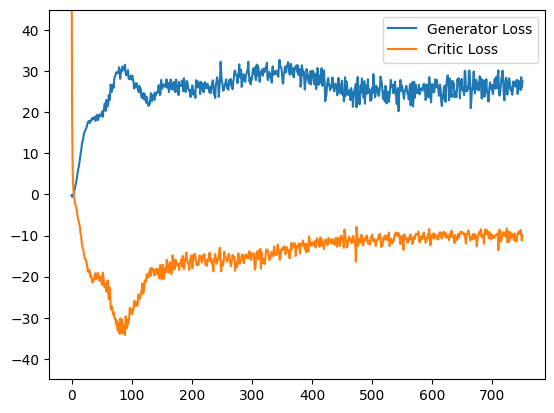

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  1500
Saved checkpoint


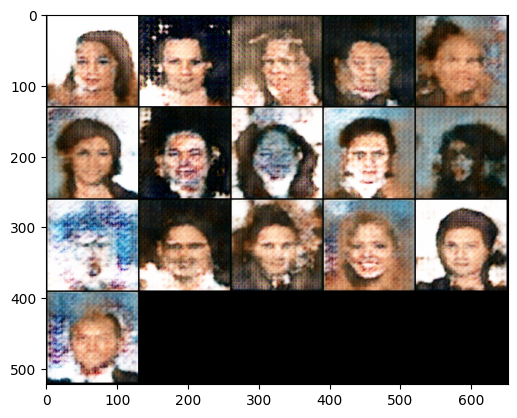

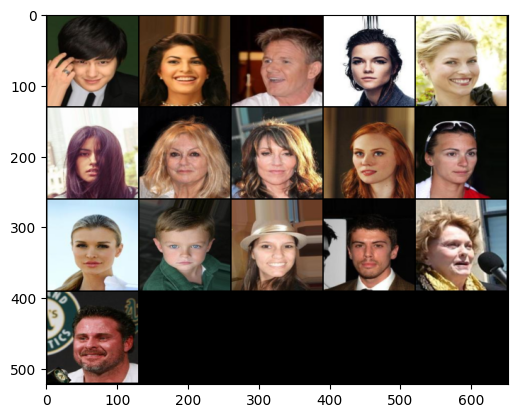

Epoch: 18, Step: 1500, Generator loss: 25.864885851542155, Critic loss: -8.988867106501257


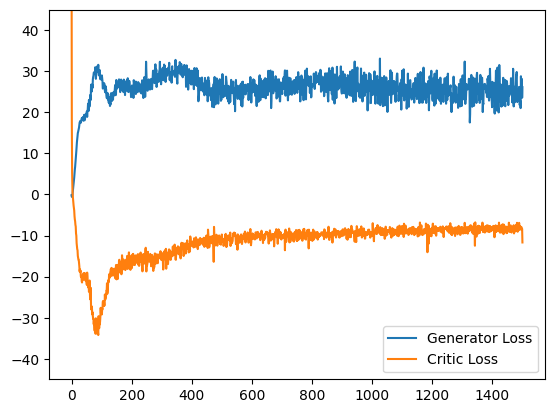

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  2250
Saved checkpoint


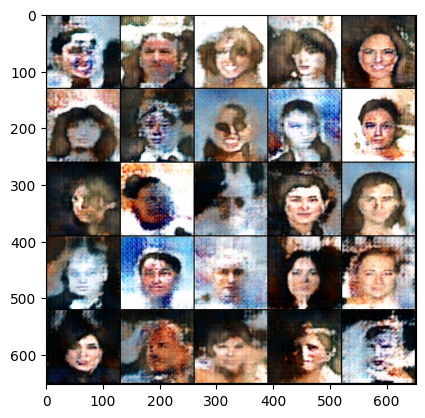

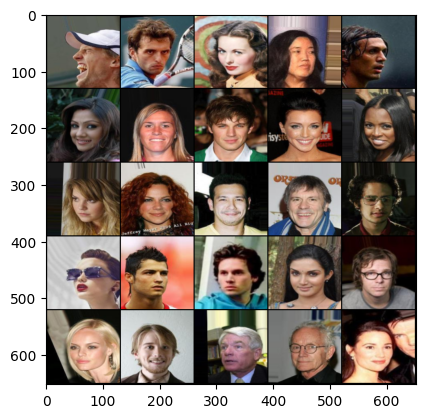

Epoch: 28, Step: 2250, Generator loss: 24.387470907847085, Critic loss: -7.70219753799439


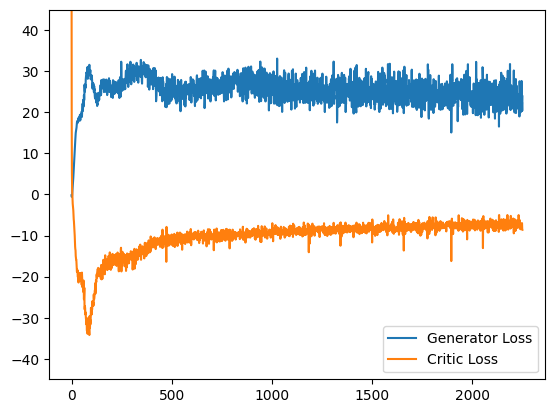

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  3000
Saved checkpoint


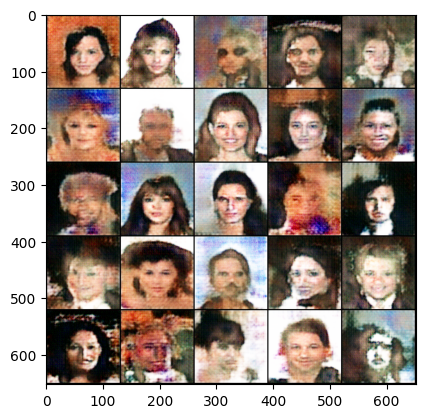

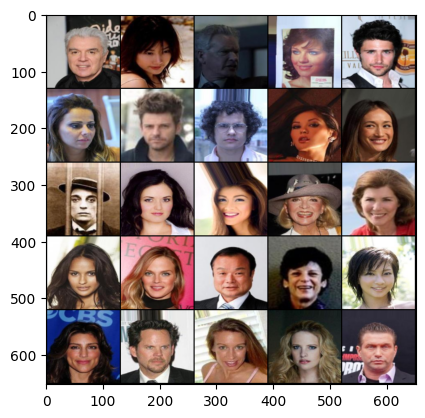

Epoch: 37, Step: 3000, Generator loss: 23.69395583343506, Critic loss: -6.948014359887443


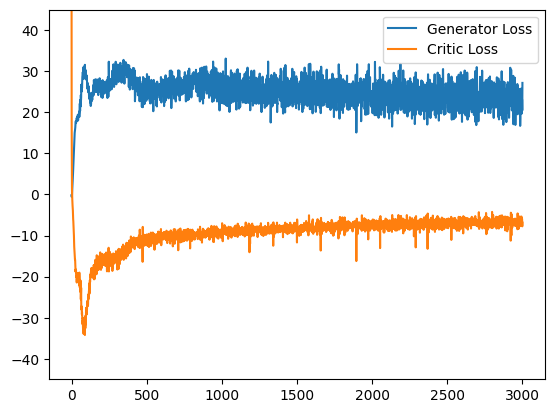

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  3750
Saved checkpoint


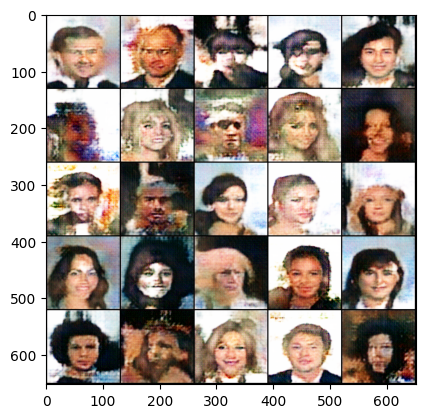

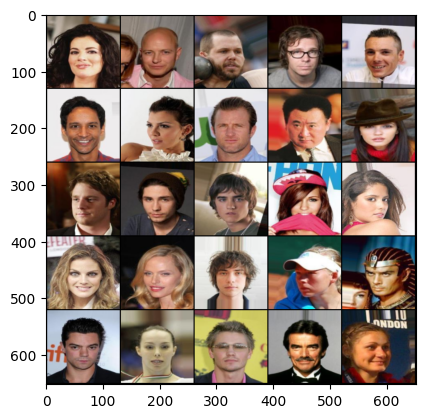

Epoch: 47, Step: 3750, Generator loss: 23.195385411580403, Critic loss: -6.472112032953901


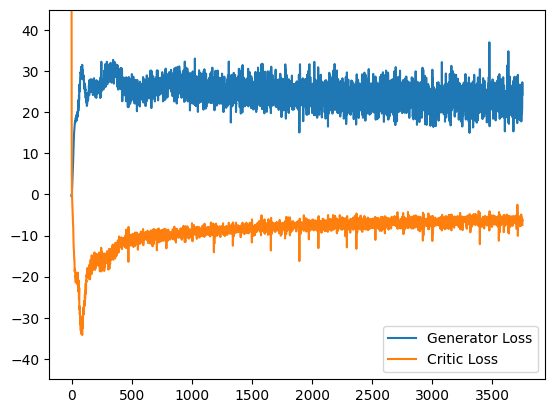

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  4500
Saved checkpoint


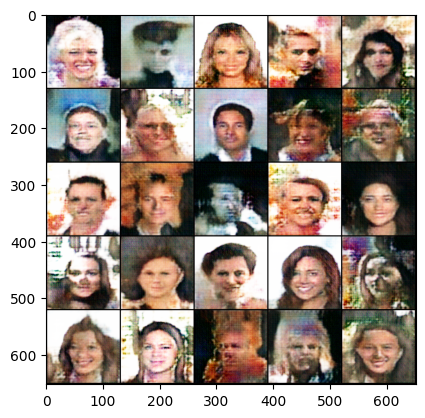

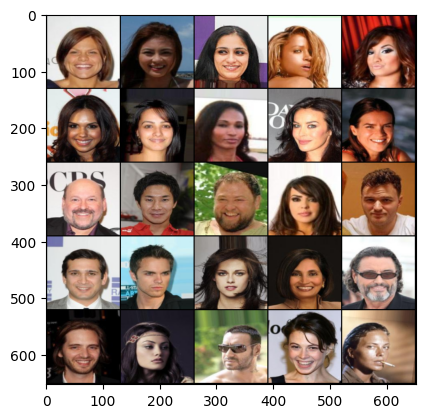

Epoch: 56, Step: 4500, Generator loss: 23.225506693522135, Critic loss: -6.2778268408775295


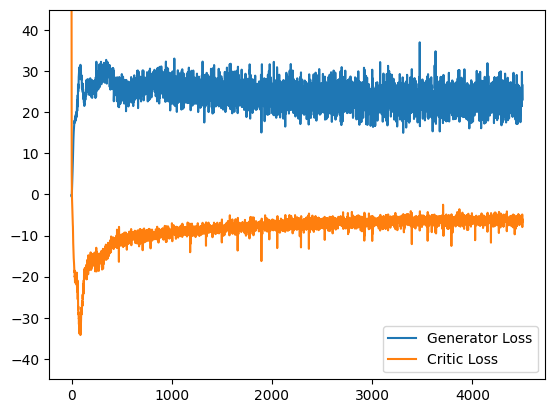

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  5250
Saved checkpoint


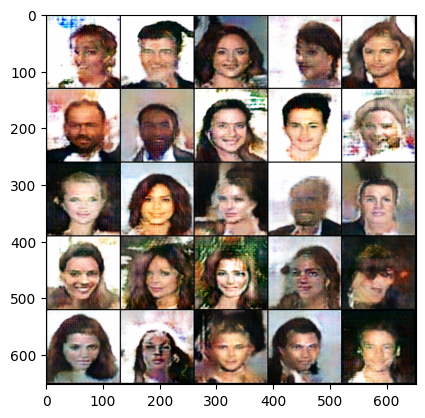

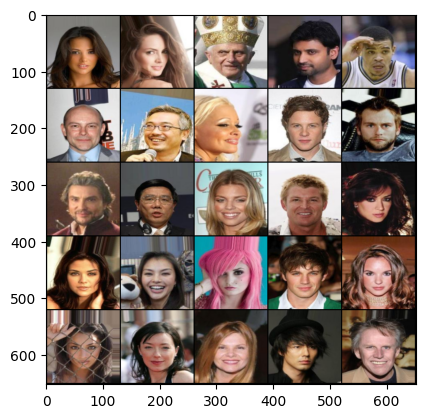

Epoch: 66, Step: 5250, Generator loss: 23.98943244298299, Critic loss: -6.208250502856575


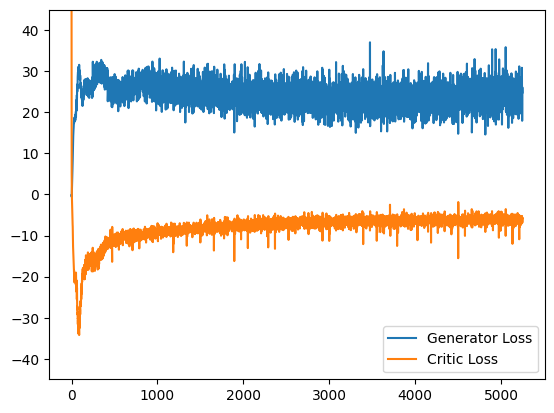

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  6000
Saved checkpoint


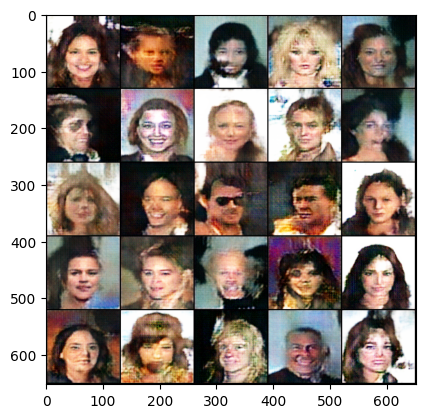

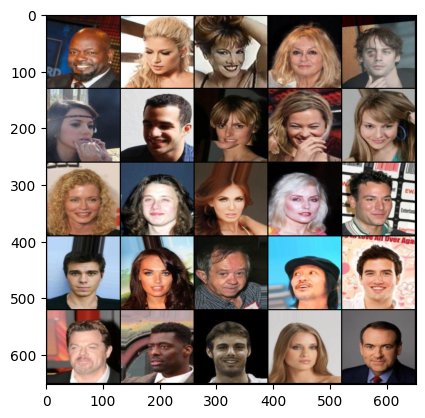

Epoch: 75, Step: 6000, Generator loss: 24.667672388712564, Critic loss: -6.254132802327485


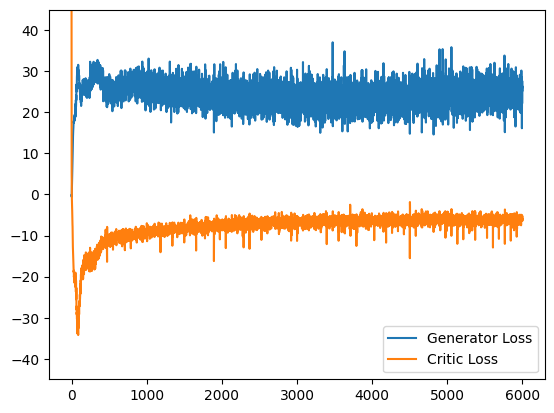

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  6750
Saved checkpoint


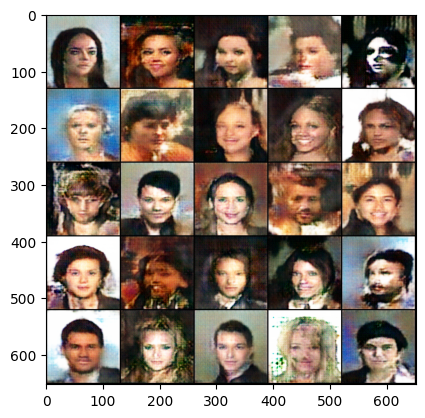

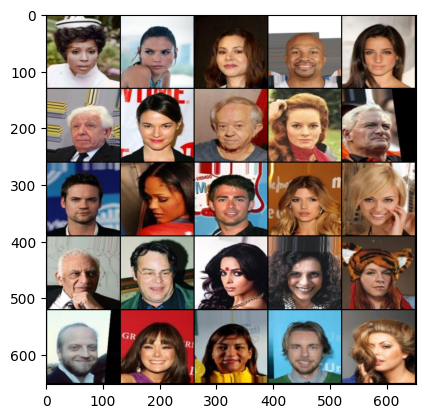

Epoch: 85, Step: 6750, Generator loss: 25.823274487813315, Critic loss: -6.391645892620088


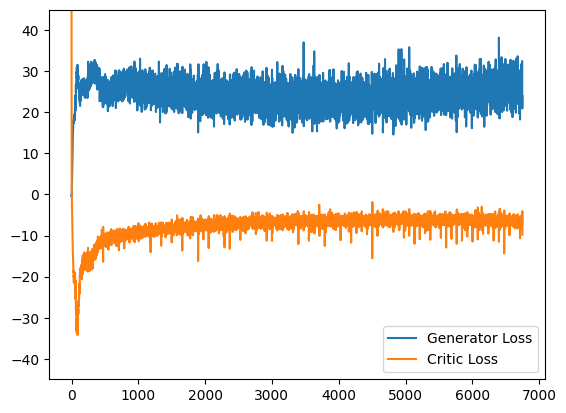

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint - Current step:  7500
Saved checkpoint


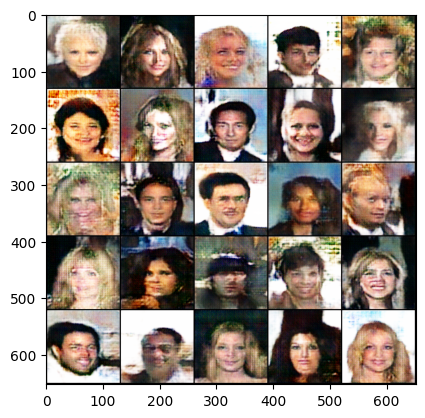

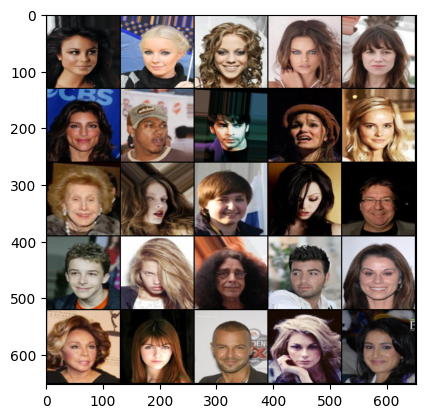

Epoch: 94, Step: 7500, Generator loss: 26.78653429412842, Critic loss: -6.5158619910558055


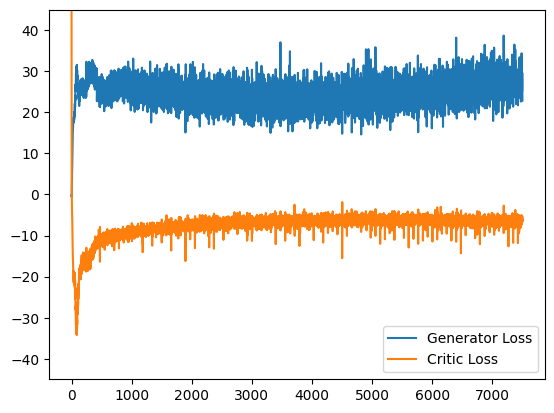

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

In [13]:
### Training loop

for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    curr_batch_size = len(real) # 128
    real = real.to(device)


    ### Critic
    mean_critic_loss = 0
    for _ in range(critic_cycles): # critic_cycles = 5
      critic_optim.zero_grad()

      noise = gen_noise(curr_batch_size, z_dim)
      fake = gen(noise)
      critic_fake_pred = critic(fake.detach()) # don't update gen parameters
      critic_real_pred = critic(real)

      alpha = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True) # 128 x 1 x 1 x 1
      gp = get_gp(real, fake.detach(), critic, alpha)

      critic_loss = critic_fake_pred.mean() - critic_real_pred.mean() + gp

      mean_critic_loss += critic_loss.item() / critic_cycles

      critic_loss.backward(retain_graph=True)
      critic_optim.step()

    critic_losses += [mean_critic_loss]


    ### Generator
    gen_optim.zero_grad()
    noise = gen_noise(curr_batch_size, z_dim)
    fake = gen(noise)
    critic_fake_pred = critic(fake)

    gen_loss = -critic_fake_pred.mean()
    gen_loss.backward()
    gen_optim.step()

    gen_losses += [gen_loss.item()]


    ### Stats
    if wandbactive == 1:
      wandb.log({'Epoch': epoch,
                 'Step': curr_step,
                 'Critic loss': mean_critic_loss,
                 'Gen loss': gen_loss})

    if (curr_step % save_step == 0 and curr_step > 0): # save_step = 250
      print("Saving checkpoint - Current step: ", curr_step)
      save_checkpoint("latest")

    if curr_step % show_step == 0: # show_step = 250
      show(fake, wandbactive=1, name='fake')
      show(real, wandbactive=1, name='real')

      gen_mean=sum(gen_losses[-show_step:]) / show_step
      critic_mean = sum(critic_losses[-show_step:]) / show_step
      print(f"Epoch: {epoch}, Step: {curr_step}, Generator loss: {gen_mean}, Critic loss: {critic_mean}")

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(gen_losses),
          label="Generator Loss"
      )

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(critic_losses),
          label="Critic Loss"
      )

      plt.ylim(-45, 45)
      plt.legend()
      plt.show()

    curr_step += 1


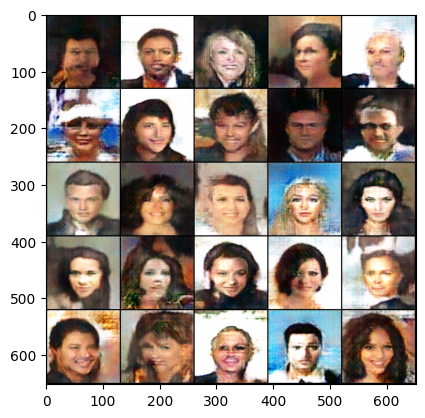

In [14]:
# Generate new faces
noise = gen_noise(batch_size, z_dim)
fake = gen(noise)
show(fake)

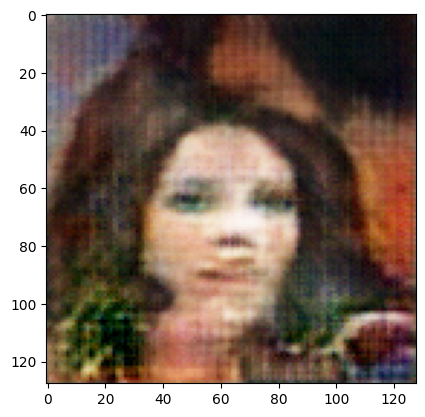

In [15]:
plt.imshow(fake[16].detach().cpu().permute(1,2,0).squeeze().clip(0,1))

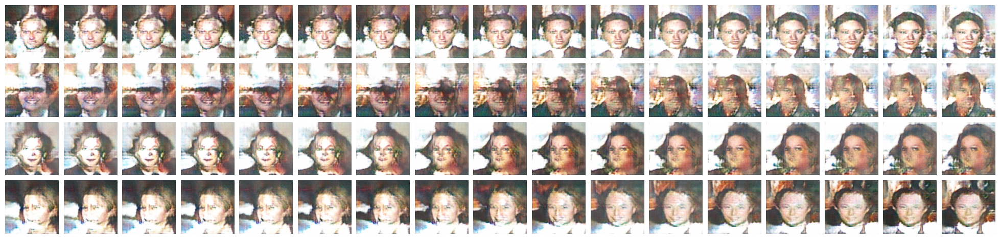

In [16]:
from mpl_toolkits.axes_grid1 import ImageGrid

# MORPHING - interpolation between points in latent space
gen_set = []
z_shape = [1, 200, 1, 1]
rows = 4
steps = 17

for i in range(rows):
  z1, z2 = torch.randn(z_shape), torch.randn(z_shape)
  for alpha in np.linspace(0, 1, steps):
    z=alpha*z1 + (1-alpha)*z2
    res=gen(z.cuda())[0]
    gen_set.append(res)

fig = plt.figure(figsize=(25, 11))
grid=ImageGrid(fig, 111, nrows_ncols=(rows,steps), axes_pad=0.1)

for ax , img in zip (grid, gen_set):
  ax.axis('off')
  res = img.cpu().detach().permute(1, 2, 0)
  res = res - res.min()
  res = res / (res.max() - res.min())
  ax.imshow(res.clip(0, 1.0))

plt.show()